In [1]:
import mne
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.image import imread
from scipy.signal import detrend
import pandas as pd

## Load and prepare some EEG data
here, I have a high-density EEG with 128 channel but you can also use a low density EEG. 

In [3]:
data = mne.io.read_raw_eeglab('example_EEG.set').get_data()
noisy = [30, 39,  44, 54, 56, 58, 59, 61, 62, 63, 71, 75, 76, 77, 78, 79, 80, 98, 112,114, 125,  126, 127]
data = np.delete(data, noisy, axis = 0)
data = data[:,10000:-800]
# mean normalize and scale
data = (data.T - data.mean(axis = 1))*10**4
data = detrend(data, axis=0)
#channel  = data[:,1]
data.shape

Reading /Users/charlotte/Documents/GitHub/EEG_to_Portrait/example_EEG.fdt


/var/folders/jt/1njpx4d93pn5y3nd0p7l5hwr0000gn/T/ipykernel_26405/2887761913.py:1: RuntimeWarning: Data file name in EEG.data (charlotte_EEG.fdt) is incorrect, the file name must have changed on disk, using the correct file name (example_EEG.fdt).
  data = mne.io.read_raw_eeglab('example_EEG.set').get_data()


(65228, 105)

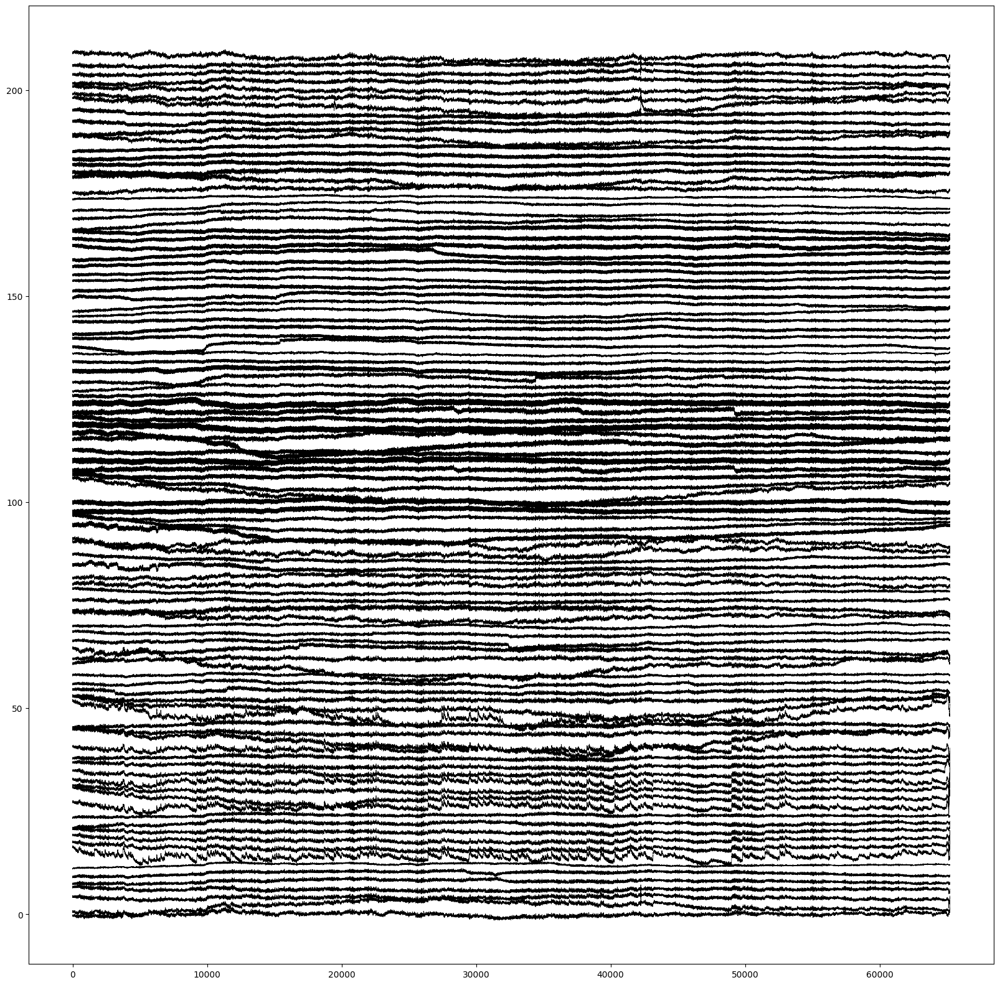

In [21]:
plt.figure(figsize=(20,20))
for ch in range(data.shape[1]):
        plt.plot((data[:,ch])+2*ch, linewidth = 0.5, color = 'black' )

# Load a picture
best is to prepare the picture, so you already have a stencil. Thie yields better results. 

In [26]:
image = imread('portrait_stencil_small2.jpg')
# darker number => more black
image_1 =  image[:,:,1]

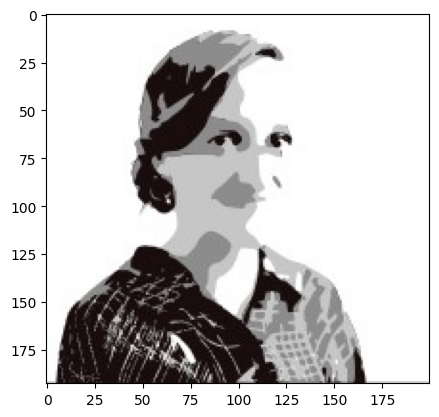

In [27]:
plt.imshow(image)

# Make your portr-EEG

### 1) select the channel you want to use for the portrait. Unless your data is really clean, using a single channel yields a better result

In [40]:
channel_sel = data[:,2]
channel_sel = data[:,70]

### 1) select some contrast hyperparameters

In [49]:
# higher squeeze values makes the overall color darker
squeeze = 0.6  

(-10.0, 210.0, -201.90239492248702, 10.237478410428308)

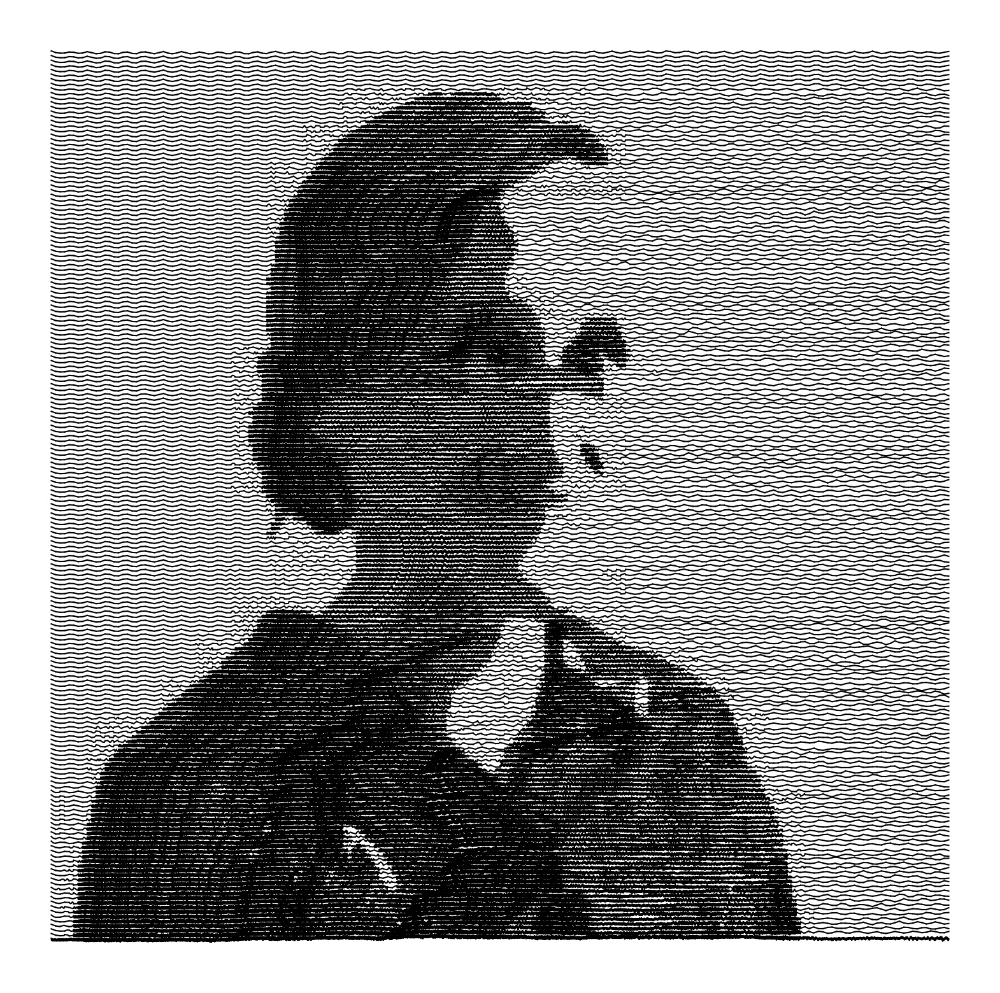

In [50]:
# version with different channels

plt.figure(figsize=(20,20))
 
for r_i, row in enumerate(image_1):
    channel = channel_sel
    t_count = 0

    for p_i, p_val in enumerate(row):
        step =  (1/(256-p_val))/squeeze
        time = np.append(np.arange(0,1.0, step), 1)
        values = channel[t_count:t_count+len(time)]
        plt.plot(p_i + time, values-(r_i-0.5), color = 'black' )
        t_count += len(time)-1
    plt.xticks([],'')
    plt.yticks([],'')

#get current axes
ax = plt.gca()

#hide axes and borders
plt.axis('off')
    
#plt.savefig('portrEEG_1.png', dpi=300)

### Same picture, using all channels

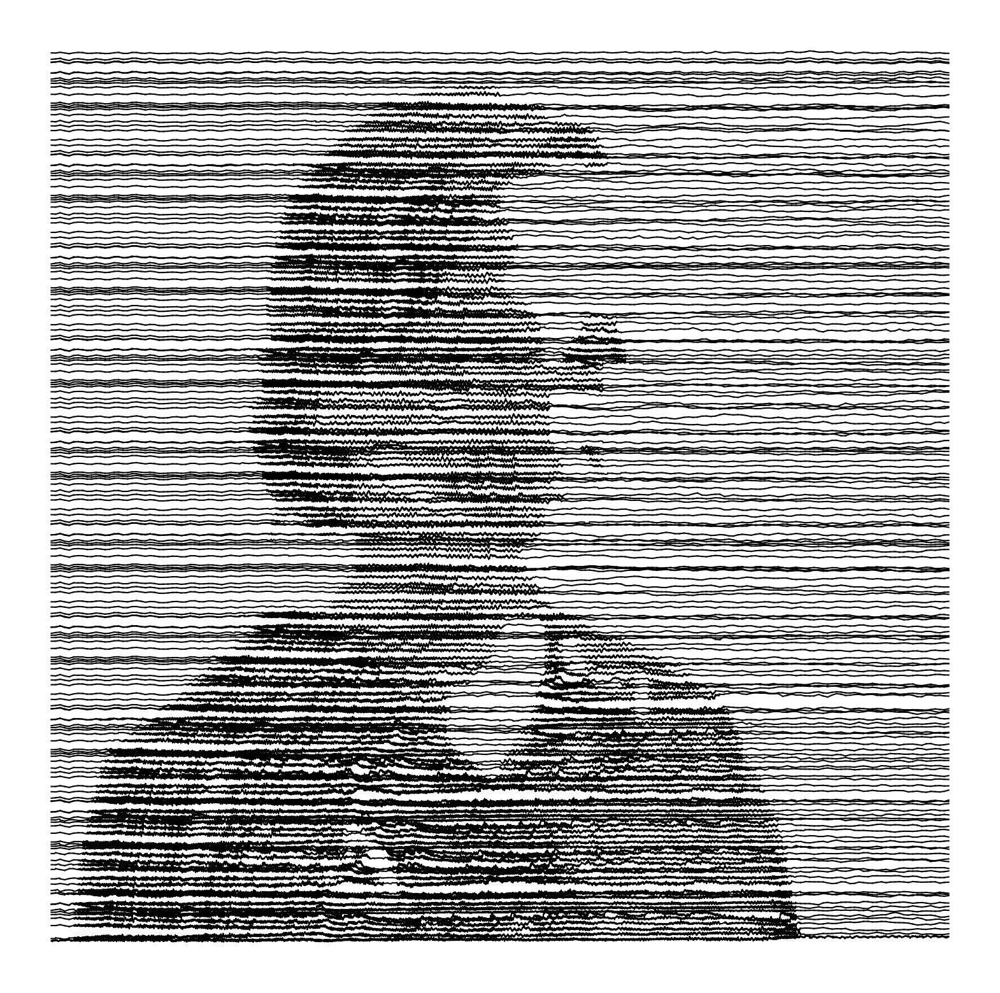

In [23]:
# version with different channels
plt.figure(figsize=(20,20))
 
for r_i, row in enumerate(image_1):
    channel = data[:,r_i%data[:,:20].shape[1]]
    t_count = 0
    
    for p_i, p_val in enumerate(row):
        step =  (1/(256-p_val))/0.3
        time = np.append(np.arange(0,1.0, step), 1)
        values = channel[t_count:t_count+len(time)]
        plt.plot(p_i + time, values-(r_i-0.5), color = 'black' )
        t_count += len(time)-1
    plt.xticks([],'')
    plt.yticks([],'')

#get current axes
ax = plt.gca()

#hide axes and borders
plt.axis('off')
    
plt.savefig('portrEEG_different_channls.png', dpi=300)

## Version with three colors and three channels

In [47]:
squeeze_1 = 0.2  
squeeze_2 = 0.3
squeeze_3 = 0.8  

channel_1 = data[:,2]
channel_2 = data[:,70]
channel_3 = data[:,40]

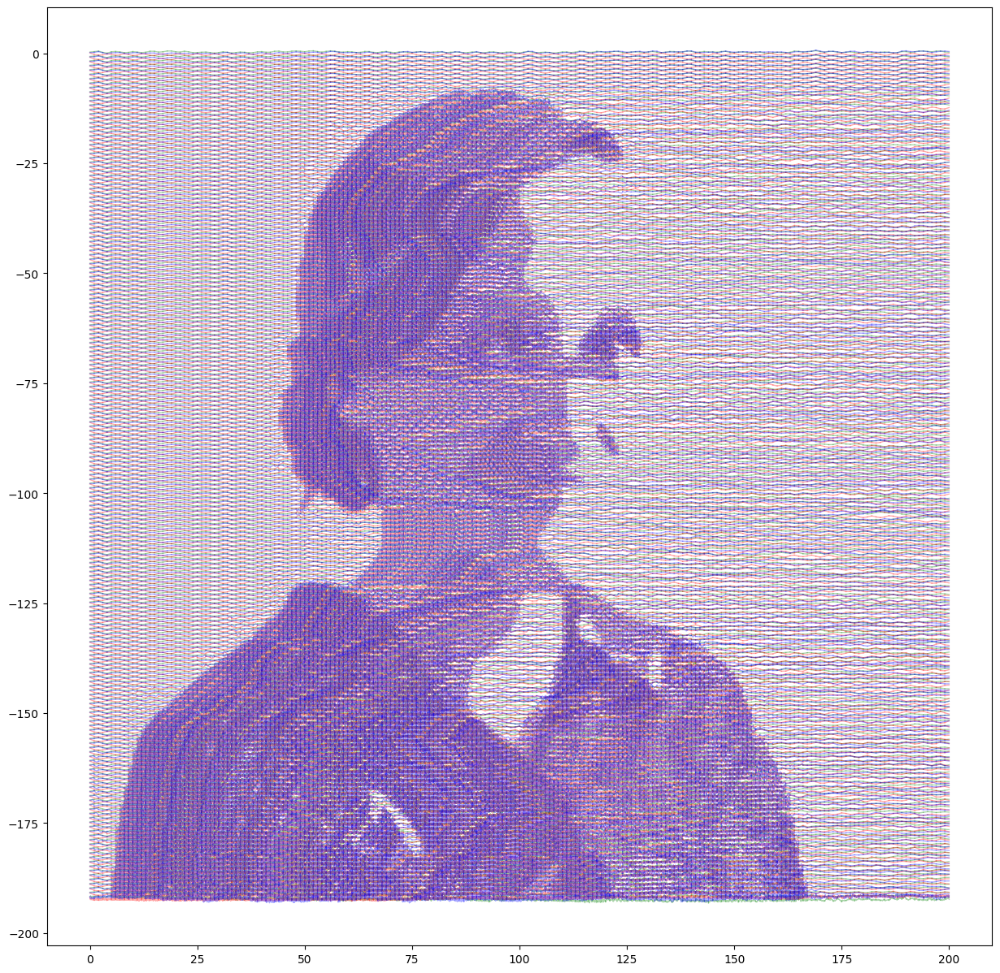

In [48]:
plt.figure(figsize=(15,15))
 
for r_i, row in enumerate(image_1):
    t_count = 0
    channel = channel_1
    for p_i, p_val in enumerate(row):
        step =  (1/(256-p_val))/squeeze_1
        time = np.append(np.arange(0,1.0, step), 1)
        values = channel[t_count:t_count+len(time)]
        plt.plot(p_i + time, values-r_i, color = 'green',linewidth = 1, alpha=0.33)
        t_count += len(time)-1
        
for r_i, row in enumerate(image_1):
    t_count = 0
    channel = channel_2
    for p_i, p_val in enumerate(row):
        step =  (1/(256-p_val))/squeeze_2
        time = np.append(np.arange(0,1.0, step), 1)
        values = channel[t_count:t_count+len(time)]
        plt.plot(p_i + time, values-r_i, color = 'red',linewidth = 1, alpha = 0.33)
        t_count += len(time)-1

for r_i, row in enumerate(image_1):
    t_count = 0
    channel = channel_3
    for p_i, p_val in enumerate(row):
        step =  (1/(256-p_val))/squeeze_3
        time = np.append(np.arange(0,1.0, step), 1)
        values = channel[t_count:t_count+len(time)]
        plt.plot(p_i + time, values-r_i, color = 'blue',linewidth = 1, alpha = 0.33)
        t_count += len(time)-1